In [1]:
from tomoSegmentPipeline.utils.common import read_array, write_array
from tomoSegmentPipeline.utils import setup

import numpy as np
import matplotlib.pyplot as plt
import random
import mrcfile
import pandas as pd
import torch
import os
from glob import glob
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import normalized_mutual_information as nmi
from scipy import ndimage

PARENT_PATH = setup.PARENT_PATH
ISONET_PATH = os.path.join(PARENT_PATH, 'data/isoNet/')

def clip_and_standardize(X, low=0.005, high=0.995, quantiles=True):
    if quantiles:
        X_clp = np.clip(X, np.quantile(X, low), np.quantile(X, high))
    else:
        X_clp = np.clip(X, low, high)
    X_stdz = (X_clp-np.mean(X_clp))/np.std(X_clp)
    
    return X_stdz

def plot_image_and_spectrum(cet, logPower, z0, y0, x0):
    
    fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
    plt.tight_layout()
    ax[0][0].imshow(cet[z0])
    ax[0][0].set_title('Image XY')

    ax[0][1].imshow(logPower[z0])
    ax[0][1].set_title('Corresponding Power Spectrum')

    ax[1][0].imshow(cet[:, y0, :])
    ax[1][0].set_title('Image ZX')

    ax[1][1].imshow(logPower[:, y0, :])
    ax[1][1].set_title('Corresponding Power Spectrum')

    ax[2][0].imshow(cet[:, :, x0])
    ax[2][0].set_title('Image ZY')

    ax[2][1].imshow(logPower[:, :, x0])
    ax[2][1].set_title('Corresponding Power Spectrum')

    plt.show()
    
    return

%matplotlib inline
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

# Spinach cells

In [2]:
# cet = os.path.join(PARENT_PATH, 'data/raw_cryo-ET/tomo32.mrc')
cet_path = os.path.join(ISONET_PATH, 'RAW_dataset/RAW_allTomos_deconv/tomo10.mrc')
cet = clip_and_standardize(read_array(cet_path))

tomo_shape = cet.shape

print(tomo_shape)

(464, 928, 928)


In [18]:
fft_cet = np.fft.fftshift(np.fft.fftn(cet))
logPower_cet = np.log(np.abs(fft_cet)**2)
logPower_cet = clip_and_standardize(logPower_cet, low=0.001, high=0.999)

## How does the inverse fourier transform of the coefficients within an annulus (cylinder) look?

Focusing on the XZ plane, it seems that around the low frequency components, the isotropic assumption holds. As we move away from the center, the power of the coefficients tend to have a bigger variance and so the isotropic assumption is less valid.

In [107]:
ring_mask = np.zeros_like(cet)

# particular_yidx = tomo_shape[1]//2

# we want to assess isotropy of the spectral power within an annulus at different y indices 
yidx_list = [tomo_shape[1]//2 - 100, tomo_shape[1]//2, tomo_shape[1]//2 + 100]

angles = []
logPower_list = dict([particular_yidx, []] for particular_yidx in yidx_list)

delta_r = 10

annulus_inner = 100
annulus_outer = annulus_inner+delta_r


for zidx, z in enumerate(range(-tomo_shape[0]//2, tomo_shape[0]//2)):
    for xidx, x in enumerate(range(-tomo_shape[2]//2, tomo_shape[2]//2)):
        r = np.linalg.norm([z, x])
        
        phi = np.arctan2(z, x)
        phi = (2*np.pi+phi)%(2*np.pi)

        if r>=annulus_inner and r<annulus_outer:
            ring_mask[zidx, :, xidx] = 1
            angles.append(phi)
            
            for particular_yidx in yidx_list:
                lp = logPower_cet[zidx, particular_yidx, xidx]
                logPower_list[particular_yidx].append(lp)

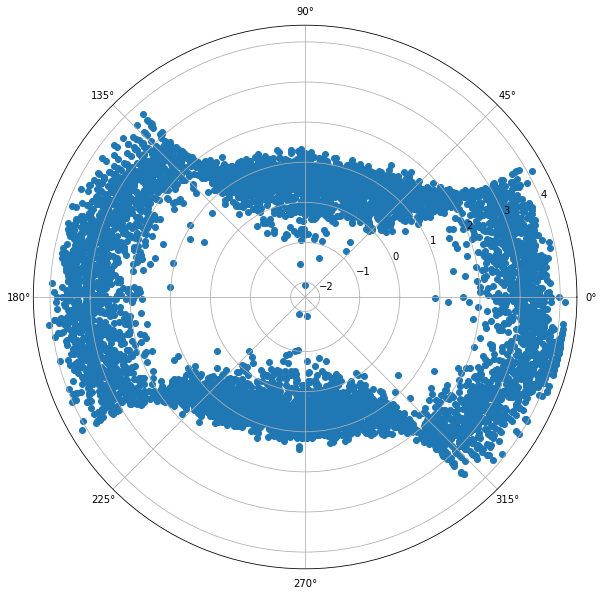

In [108]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(12,10))
ax.scatter(angles, logPower_list[yidx_list[0]])
ax.grid(True)
plt.show()

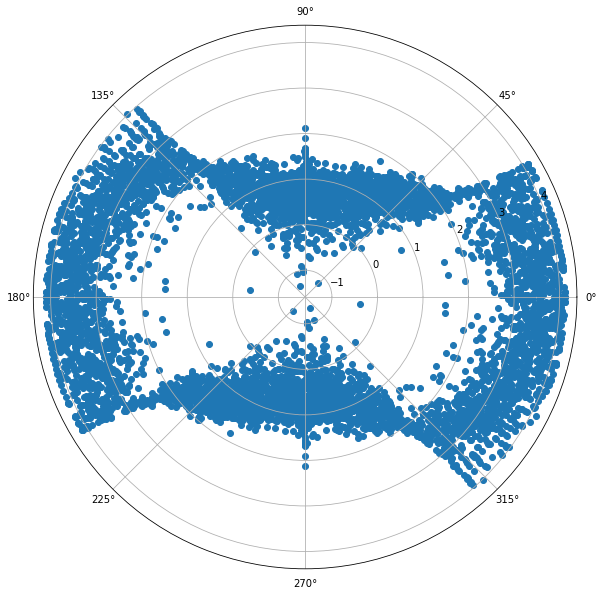

In [109]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(12,10))
ax.scatter(angles, logPower_list[yidx_list[1]])
ax.grid(True)
plt.show()

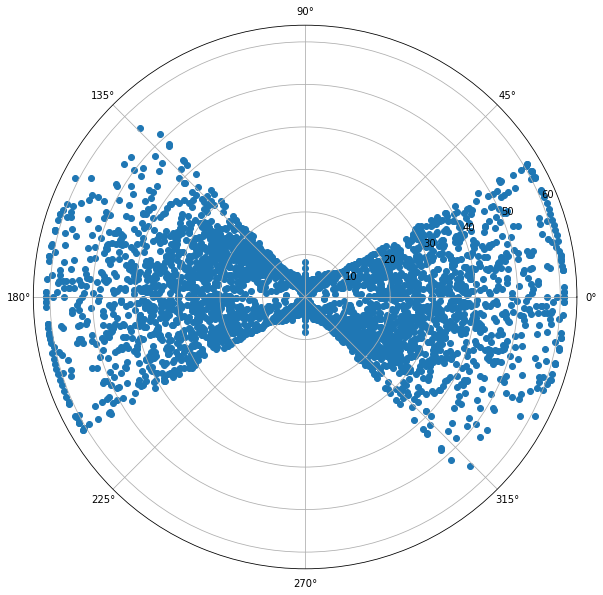

In [115]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(12,10))
ax.scatter(angles, np.exp(np.array(logPower_list[yidx_list[1]])))
ax.grid(True)
plt.show()

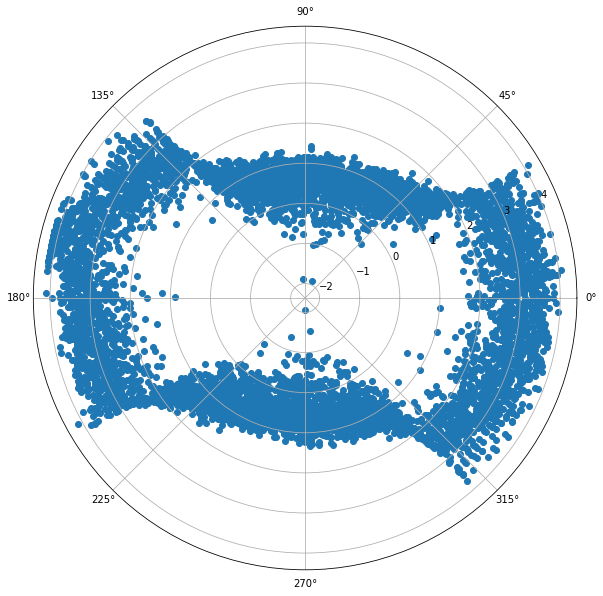

In [110]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(12,10))
ax.scatter(angles, logPower_list[yidx_list[2]])
ax.grid(True)
plt.show()

(array([  12.,   48.,  234.,  988., 1376.,  724.,  400.,  736., 1122.,
         932.]),
 array([-1.31748023, -0.77482068, -0.23216112,  0.31049843,  0.85315798,
         1.39581754,  1.93847709,  2.48113664,  3.0237962 ,  3.56645575,
         4.1091153 ]),
 <BarContainer object of 10 artists>)

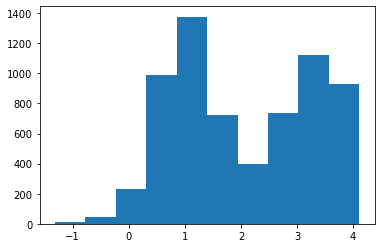

In [111]:
plt.hist(logPower_list[yidx_list[1]])

In [112]:
fft_masked = fft_cet*ring_mask
cet_masked = np.fft.ifftn(np.fft.ifftshift(fft_masked))
cet_masked = np.real(cet_masked)

logPower_masked = logPower_cet*ring_mask
# fft_masked = np.fft.fftshift(np.fft.fftn(cet_masked))
# logPower_masked = np.log(np.abs(fft_masked)**2)
# logPower_masked = clip_and_standardize(logPower_masked, low=0.001, high=0.999)

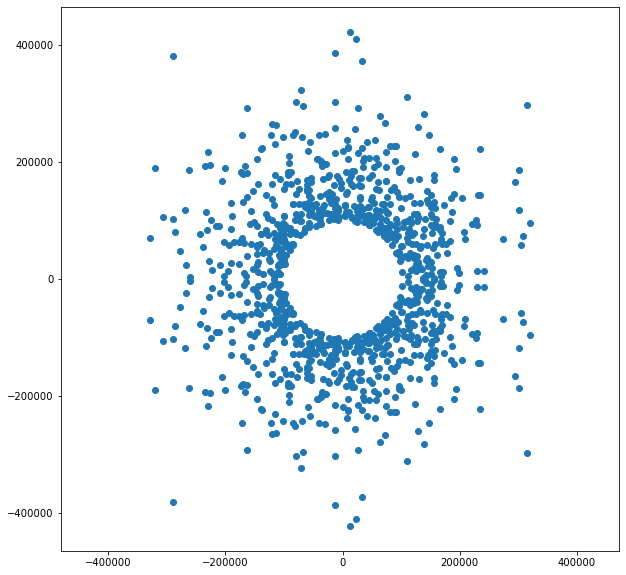

In [124]:
aux = fft_masked[:, yidx_list[1], :]
aux = aux[logPower_masked[:, yidx_list[1], :]>3.5]

plt.figure(figsize=(10,10))
plt.axis('equal')
plt.scatter(np.real(aux), np.imag(aux))

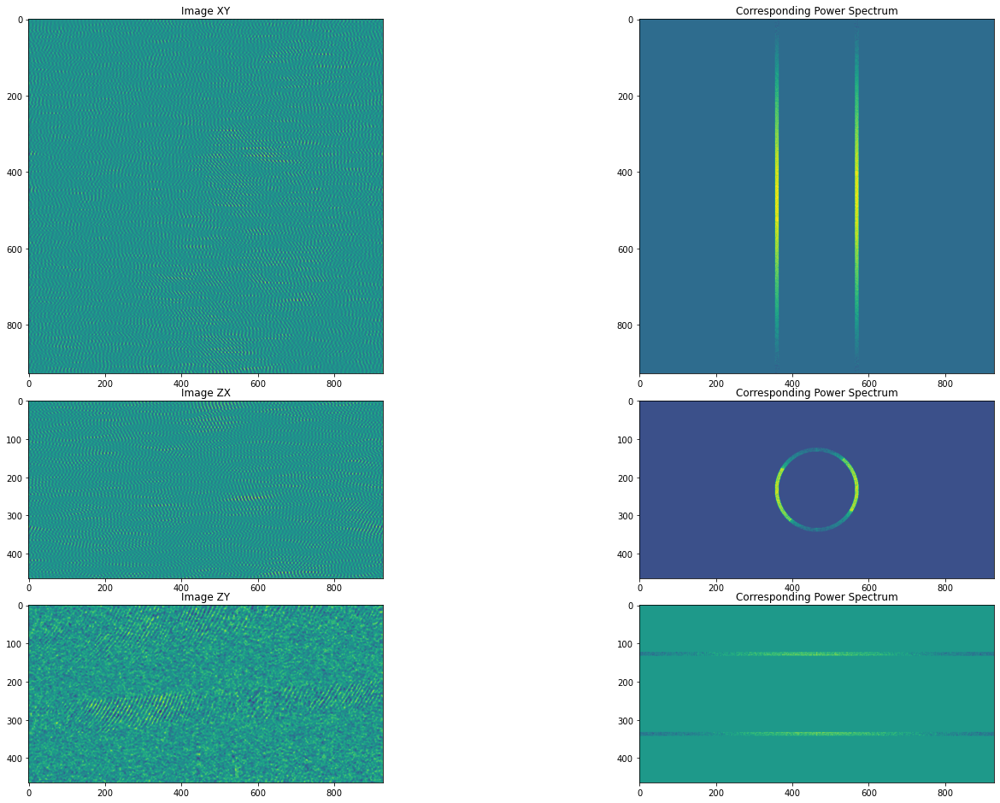

In [113]:
z0, y0, x0 = [s//2 for s in tomo_shape]
plot_image_and_spectrum(cet_masked, logPower_masked, z0, y0, x0)

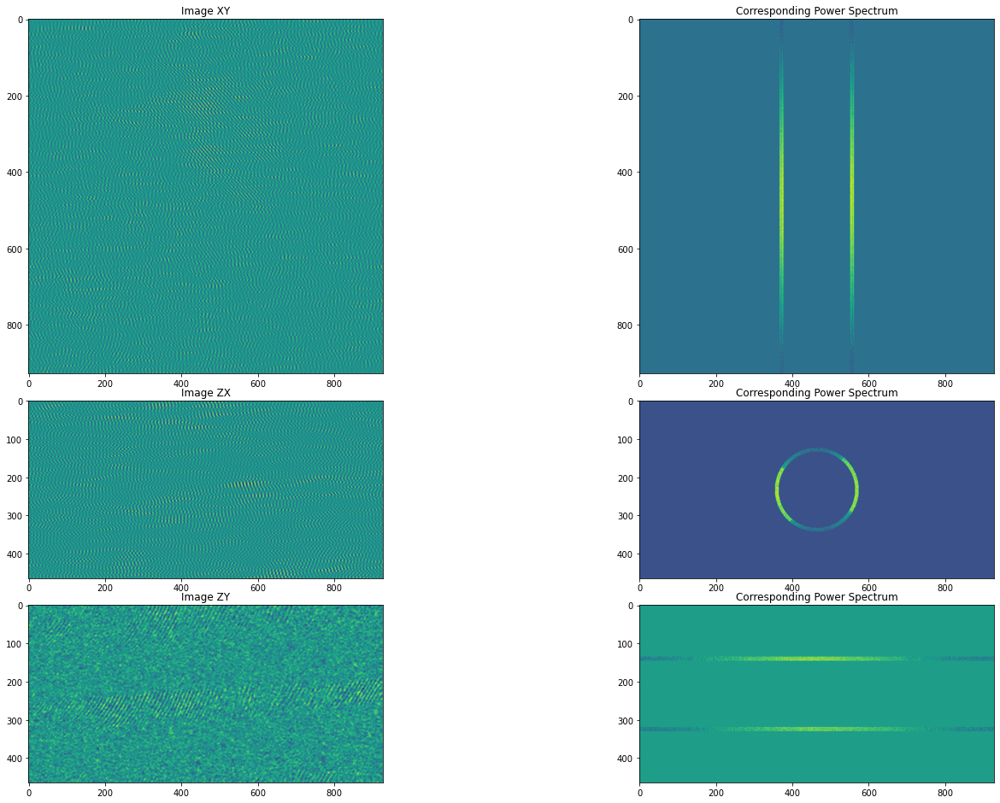

In [125]:
z0, y0, x0 = [s//2 + 50 for s in tomo_shape]
plot_image_and_spectrum(cet_masked, logPower_masked, z0, y0, x0)

In [102]:
ssim(cet, cet_masked)

0.006537462274927312

## Pilot: make shell

In [4]:
# shape: (100, 100)

_tomo_shape = (100, 100, 100)
shell_mask = np.zeros(_tomo_shape)

delta_r = 25

shell_inner = 20
shell_outer = shell_inner+delta_r

# only do positive quadrant first
for z in range(0, shell_outer+1):
    for y in range(0, shell_outer+1):
        for x in range(0, shell_outer+1):
            r = np.linalg.norm([y, x, z])

            if r>=shell_inner and r<=shell_outer:
                
                zidx = z + _tomo_shape[0]//2
                yidx = y + _tomo_shape[1]//2
                xidx = x + _tomo_shape[2]//2

                shell_mask[zidx, yidx, xidx] = 1
                
aux = np.rot90(shell_mask, axes=(0, 1)) + np.rot90(shell_mask, 2, axes=(0, 1)) + np.rot90(shell_mask, 3, axes=(0, 1))

shell_mask2 = shell_mask + aux 
shell_mask2 += np.rot90(shell_mask2, 2, axes=(1, 2))

In [5]:
np.unique(shell_mask2)

array([0., 1.])

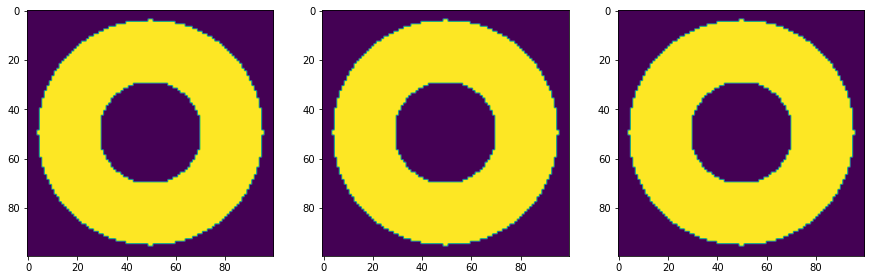

In [6]:
fig, ax = plt.subplots(1, 3, figsize=(15, 8))
ax[0].imshow(shell_mask2[_tomo_shape[0]//2])
ax[1].imshow(shell_mask2[:, _tomo_shape[1]//2, :])
ax[2].imshow(shell_mask2[:, : ,_tomo_shape[2]//2])

## How does the inverse fourier transform of the coefficients within a 3D shell look?

In [50]:
delta_r = 20

shell_inner = 10
shell_outer = shell_inner+delta_r

z_list = []
y_list = []
x_list = []

mask_shape = 3*[min(tomo_shape)]
_shell_mask = np.zeros(mask_shape)

# only do positive quadrant first
for z in range(0, shell_outer+1):
    for y in range(0, shell_outer+1):
        for x in range(0, shell_outer+1):
            r = np.linalg.norm([y, x, z])

            if r>=shell_inner and r<=shell_outer:
                
                zidx = z + mask_shape[0]//2
                yidx = y + mask_shape[1]//2
                xidx = x + mask_shape[2]//2

                _shell_mask[zidx, yidx, xidx] = 1

# first get shell for x>0
aux = np.rot90(_shell_mask, axes=(0, 1)) + np.rot90(_shell_mask, 2, axes=(0, 1)) + np.rot90(_shell_mask, 3, axes=(0, 1))
aux2 = _shell_mask + aux 

# now reflect the shell along x to get the mask
aux2 += np.rot90(aux2, 2, axes=(1, 2))

# now fill the actual shape of the tomogram with the mask
shell_mask = np.zeros(tomo_shape)
shell_mask[(tomo_shape[0] - mask_shape[0])//2:(tomo_shape[0] + mask_shape[0])//2,
            (tomo_shape[1] - mask_shape[1])//2:(tomo_shape[1] + mask_shape[1])//2,
            (tomo_shape[2] - mask_shape[2])//2:(tomo_shape[2] + mask_shape[2])//2] = aux2

del aux, aux2

In [51]:
fft_masked = fft_cet*shell_mask
cet_masked = np.fft.ifftn(np.fft.ifftshift(fft_masked))
cet_masked = np.real(cet_masked)

logPower_masked = logPower_cet*shell_mask
# fft_masked = np.fft.fftshift(np.fft.fftn(cet_masked))
# logPower_masked = np.log(np.abs(fft_masked)**2)
# logPower_masked = clip_and_standardize(logPower_masked, low=0.001, high=0.999)

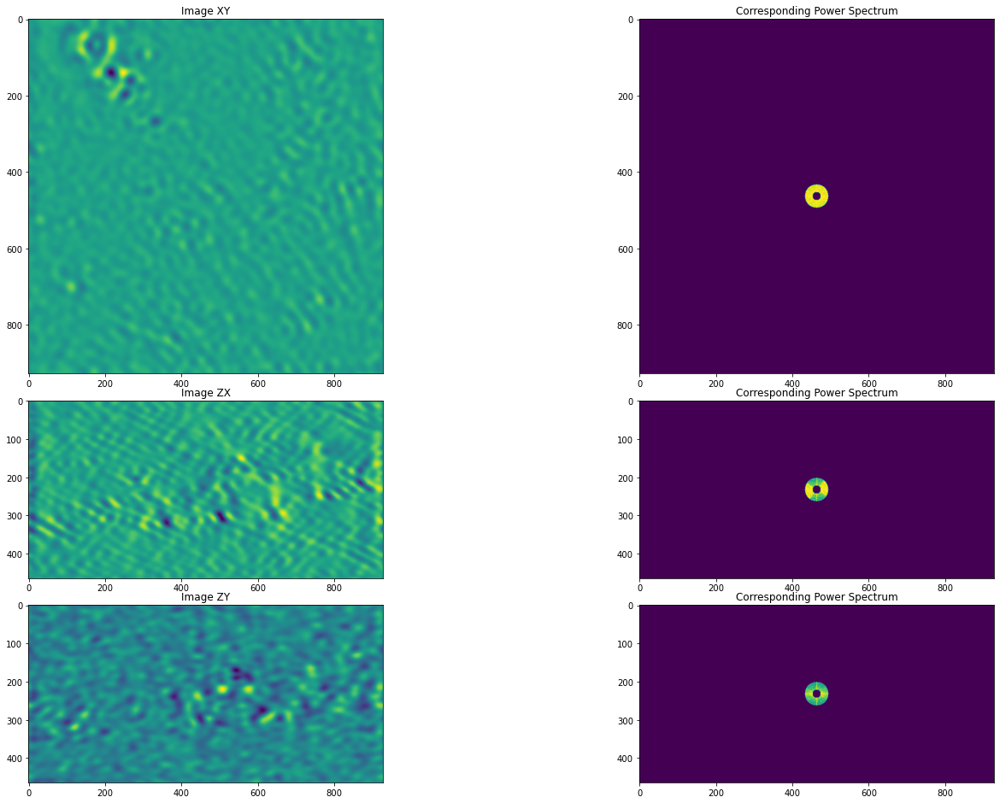

In [52]:
z0, y0, x0 = [s//2 for s in tomo_shape]
plot_image_and_spectrum(cet_masked, logPower_masked, z0, y0, x0)

In [53]:
# a ball of r=150 yields ssim = 0.8486415205220202
# ssim(cet, cet_masked)

(array([1.0000e+01, 1.6000e+01, 9.2000e+01, 2.9900e+02, 1.5200e+03,
        5.4560e+03, 1.5000e+04, 2.1880e+04, 1.9081e+04, 5.3262e+04]),
 array([-0.34305349,  0.10216339,  0.54738027,  0.99259715,  1.43781403,
         1.88303091,  2.32824779,  2.77346467,  3.21868155,  3.66389843,
         4.1091153 ]),
 <BarContainer object of 10 artists>)

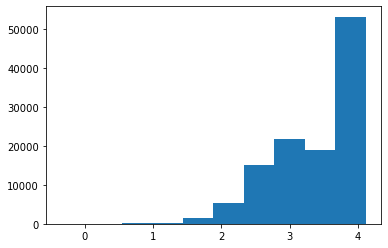

In [54]:
plt.hist(logPower_masked[logPower_masked!=0].flatten())

## Inverse fourier of one ZX slice

According to this image, we should be on Step 3 with one of the slices

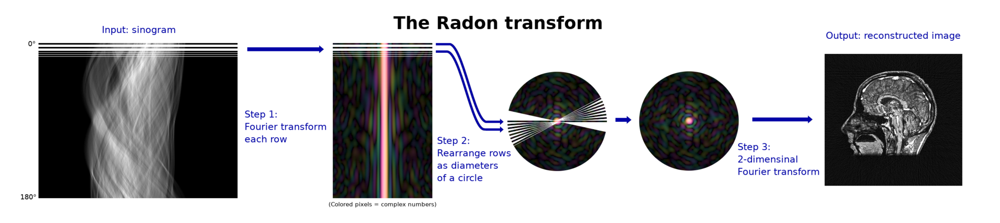

Why does it make sense for the XZ slices that the fourier transform of a slice is qualitatively equal to the slice of the fourier transform?

0


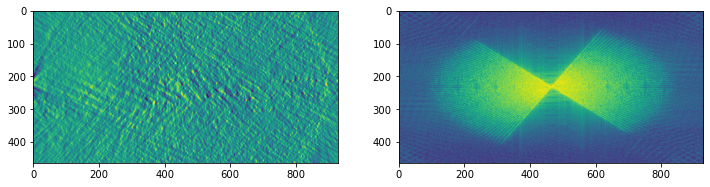

50


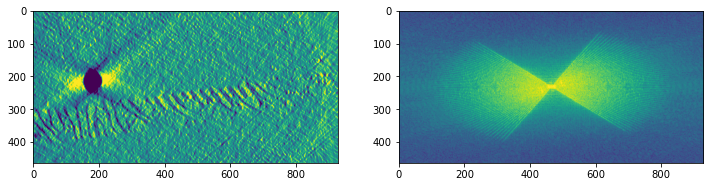

100


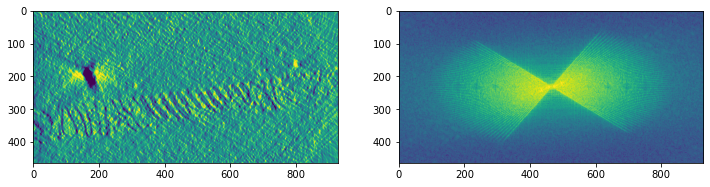

150


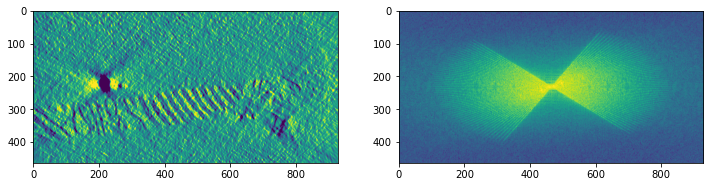

200


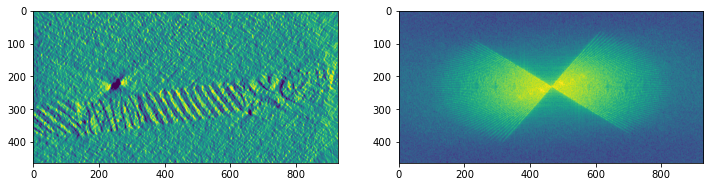

250


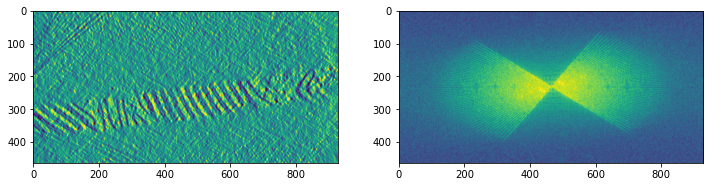

300


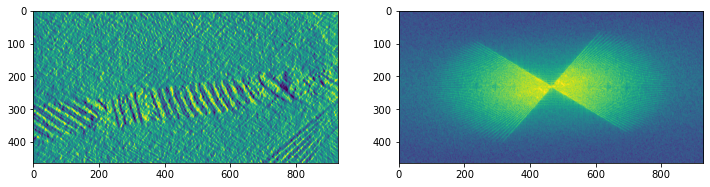

350


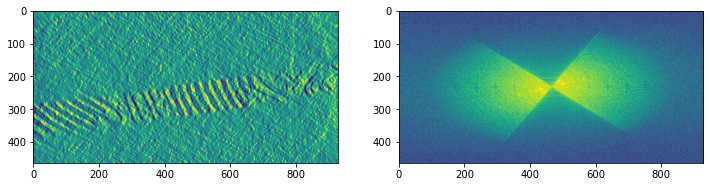

400


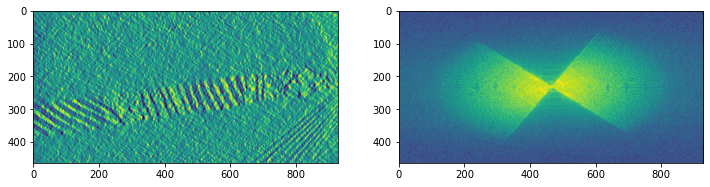

450


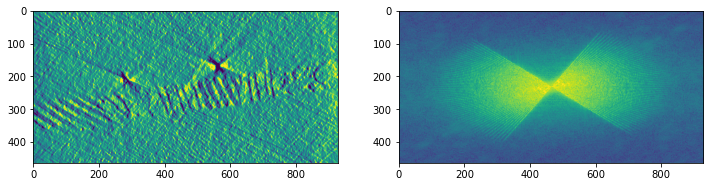

500


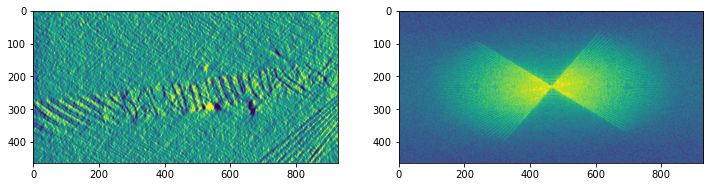

550


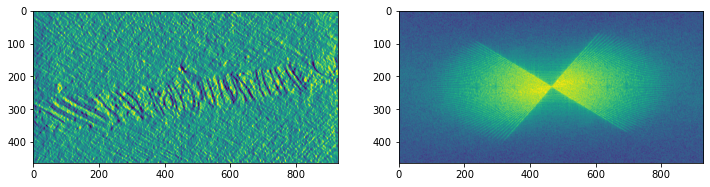

600


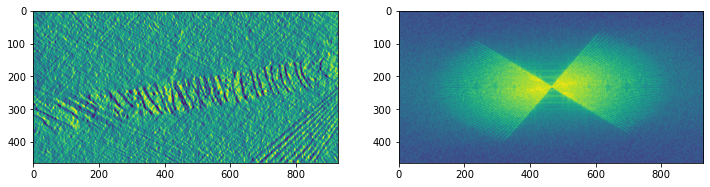

650


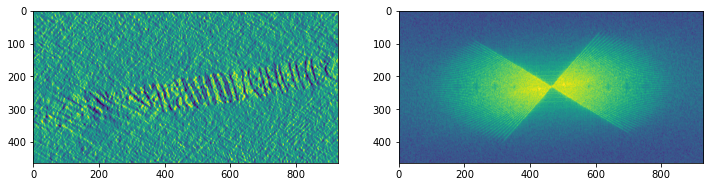

700


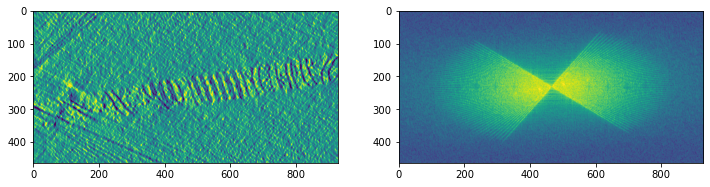

750


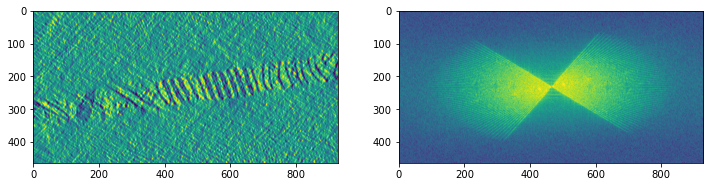

800


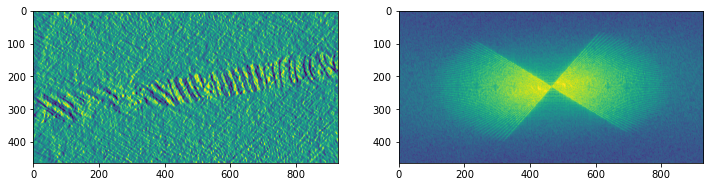

850


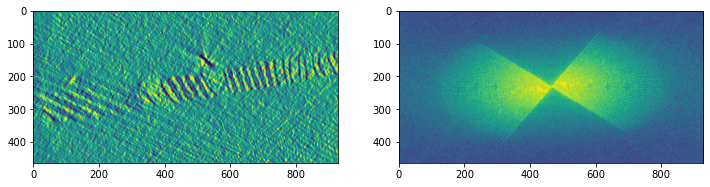

900


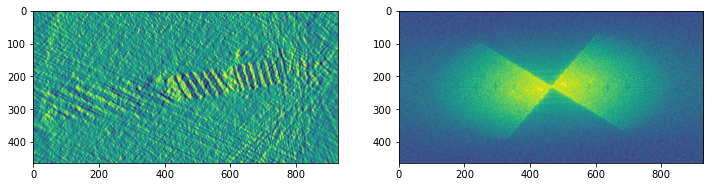

In [37]:
# yidx = tomo_shape[1]//2

for yidx in range(0, tomo_shape[1], 50):
    print(yidx)
    xz_slice = cet[:, yidx, :]
    fft_slice = np.fft.fftshift(np.fft.fft2(xz_slice))
    logPower_slice = np.log(np.abs(fft_slice)**2)
    logPower_slice = clip_and_standardize(logPower_slice, low=0.001, high=0.999)

    fig, ax = plt.subplots(1, 2, figsize=(12, 8))
    ax[0].imshow(xz_slice)
    ax[1].imshow(logPower_slice)
    plt.show()

In [33]:
xz_iFslice = np.fft.ifft2(np.fft.ifftshift(fft_slice)).real

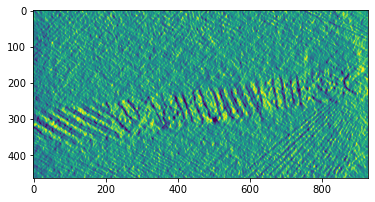

In [34]:
plt.imshow(xz_iFslice)

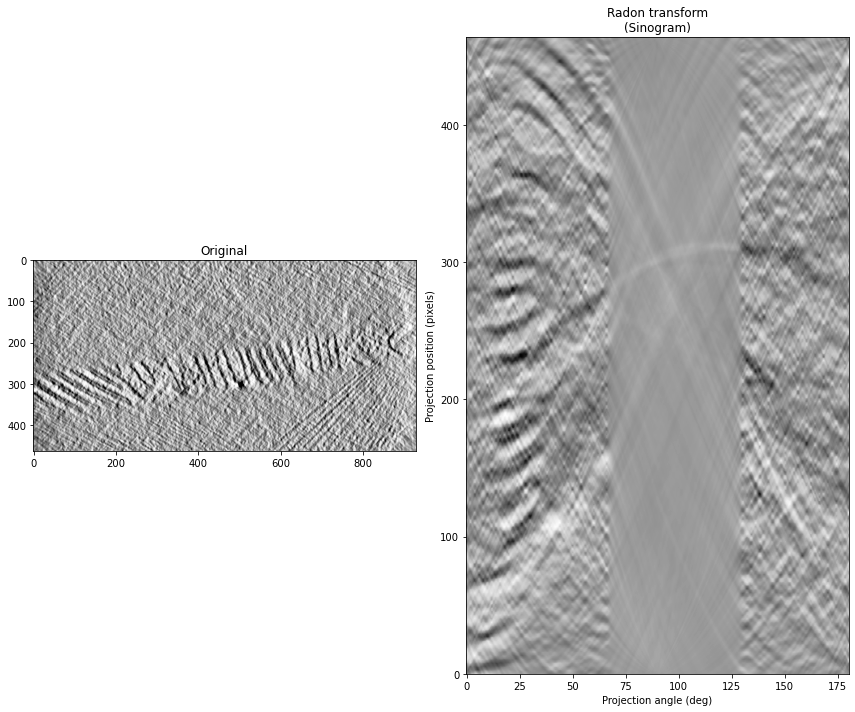

In [35]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.data import shepp_logan_phantom
from skimage.transform import radon, rescale

image = xz_slice
# image = rescale(image, scale=0.4, mode='reflect', channel_axis=None)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 10))

ax1.set_title("Original")
ax1.imshow(image, cmap=plt.cm.Greys_r)

theta = np.linspace(0., 180., max(image.shape), endpoint=False)
sinogram = radon(image, theta=theta)
dx, dy = 0.5 * 180.0 / max(image.shape), 0.5 / sinogram.shape[0]
ax2.set_title("Radon transform\n(Sinogram)")
ax2.set_xlabel("Projection angle (deg)")
ax2.set_ylabel("Projection position (pixels)")
ax2.imshow(sinogram, cmap=plt.cm.Greys_r,
           extent=(-dx, 180.0 + dx, -dy, sinogram.shape[0] + dy),
           aspect='auto')

fig.tight_layout()
plt.show()

In [28]:
zidx = tomo_shape[0]//3
xy_slice = cet[zidx]
fft_slice = np.fft.fftshift(np.fft.fft2(xy_slice))
logPower_slice = np.log(np.abs(fft_slice)**2)
logPower_slice = clip_and_standardize(logPower_slice, low=0.001, high=0.999)

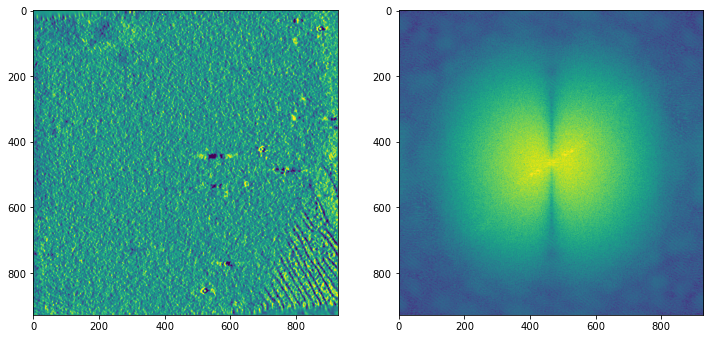

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
ax[0].imshow(xy_slice)
ax[1].imshow(logPower_slice)

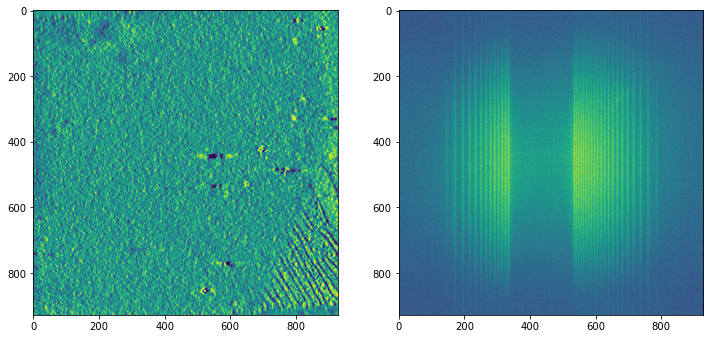

In [31]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
ax[0].imshow(cet[zidx])
ax[1].imshow(logPower_cet[zidx])

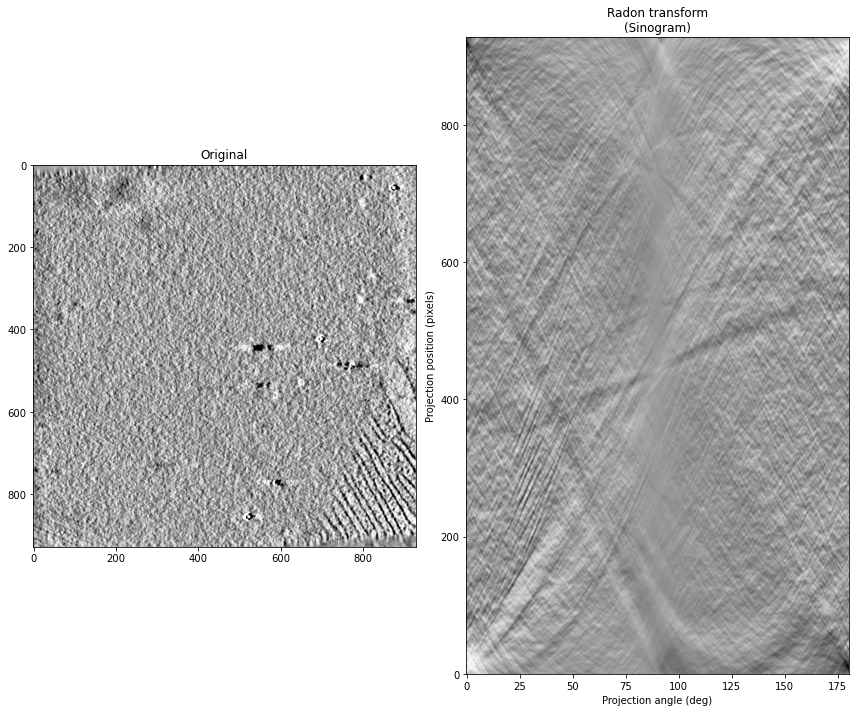

In [30]:
image = xy_slice
# image = rescale(image, scale=0.4, mode='reflect', channel_axis=None)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 10))

ax1.set_title("Original")
ax1.imshow(image, cmap=plt.cm.Greys_r)

theta = np.linspace(0., 180., max(image.shape), endpoint=False)
sinogram = radon(image, theta=theta)
dx, dy = 0.5 * 180.0 / max(image.shape), 0.5 / sinogram.shape[0]
ax2.set_title("Radon transform\n(Sinogram)")
ax2.set_xlabel("Projection angle (deg)")
ax2.set_ylabel("Projection position (pixels)")
ax2.imshow(sinogram, cmap=plt.cm.Greys_r,
           extent=(-dx, 180.0 + dx, -dy, sinogram.shape[0] + dy),
           aspect='auto')

fig.tight_layout()
plt.show()